# Probability Distributions for Investments

In [65]:
import numpy as np
import pandas as pd
from scipy.stats import t, chi2,f
import plotly.figure_factory as ff
import plotly.express as px

#### Helper Functions to Plot Probability Distributions
probability density and cumulative probability plots using plotly
+ probability density function
+ cumulative density function

In [68]:
def plot_pdf(df, title, xtitle, show_hist=True, show_curve=True, show_rug=True):
    """
    Plot the probability density function
    data: dataframe
    title: plot title
    Reference:https://plotly.com/python-api-reference/generated/plotly.figure_factory.create_distplot.html
    """
    # make sure df is a dataframe
    df = pd.DataFrame(df)
    
    # convert to list of lists
    lst =[]
    for col in df.columns:
        lst.append(df[col].values)
        
    # only show the legend if there is more than one series to plot    
    show_legend = True if len(df.columns)>1 else False

    fig = ff.create_distplot(
        hist_data = lst,
        group_labels = df.columns,
        colors=px.colors.qualitative.Safe,
        show_hist=show_hist,
        show_curve=show_curve,
        show_rug=show_rug
    )
    fig.update_layout(
        template='plotly_white',
        width=400, height=400,
        title=title,
        xaxis_title=xtitle,
        yaxis_title='probability (%)',
        showlegend=show_legend
    )
    fig.show()
    
def plot_cdf(data,title,xtitle, marginal='box'):
    """ 
    Plot the cumulative distribution function
    data: dataframe of observations
    title: plot title
    marginal: marginal plot type (rug, histogram, box, violin)
    Reference: https://plotly.com/python-api-reference/generated/plotly.express.ecdf.html
    """
    show_legend = True if len(df.columns)>1 else False
    fig = px.ecdf(
        data,
        marginal=marginal,
        markers=False,
        lines=True,
        color_discrete_sequence=px.colors.qualitative.Safe,
    )
    fig.update_layout(
        template='plotly_white',
        width=400, height=400,
        title=title,
        xaxis_title=xtitle,
        yaxis_title='probability (%)',
        showlegend=show_legend
    )
    fig.show()
    
def calc_probability(data, text, no_sims, comparision, value):
    if comparision==">":
        prob = sum(data>value)/no_sims
    elif comparision==">=":
        prob = sum(data>=value)/no_sims
    elif comparision=="<":
        prob = sum(data<value)/no_sims
    elif comparision=="<=":
        prob = sum(data<=value)/no_sims
    else: # ==
        prob = sum(data==value)/no_sims
    print(f"{text} = {prob*100:,.2f}%")
    return prob

## Discrete Uniform Distributions
+ X(x1, x2, ....xn)
+ X = discreate random variable, xn=value of variable
+ can take on a finite or infinite number of countable values
+ number of shares traded in a day Xshares (x1, x2, .....xinfinite)

**Calculate the Probability of Dice Rolls**

Roll a fair and bias die, and calculate the associated probabilities of rolling exactly 3, or a die less than 3

Probability of rolling a 3 (fair) = 17.24%
Probability of rolling a 3 (bias) = 49.89%
Probability of rolling less than 3 (fair) = 33.29%
Probability of rolling less than 3 (bias) = 9.87%


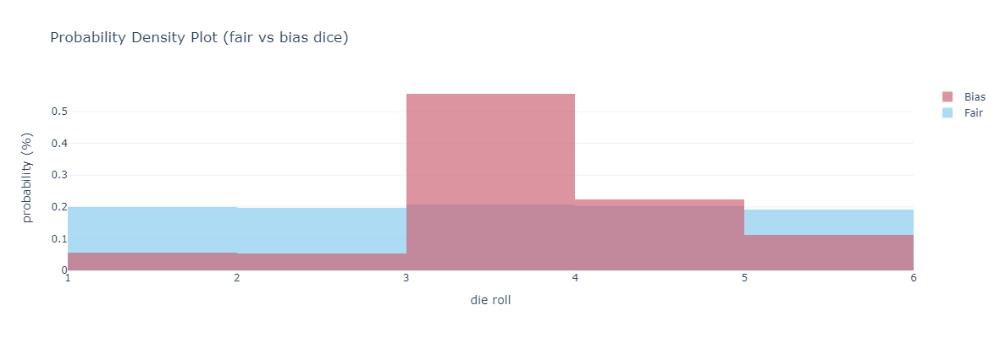

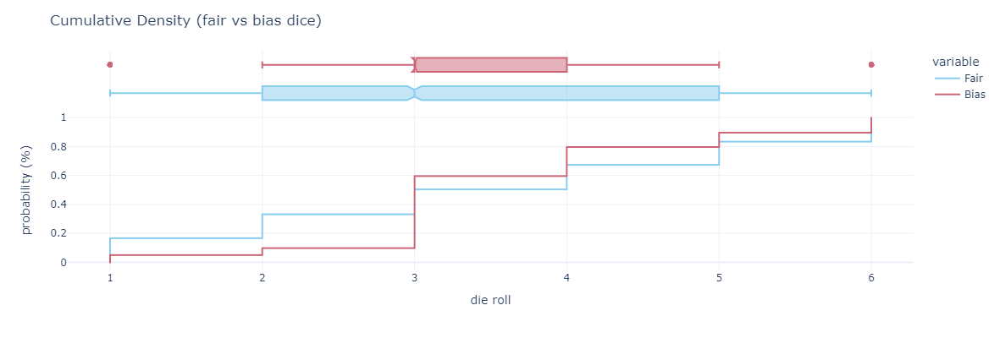

In [3]:
# Discrete Random Variables
num_rolls = 10000
values = [1, 2, 3, 4, 5, 6]

fair = np.random.choice(a=values, size=num_rolls, replace=True)
bias = np.random.choice(a=values, size=num_rolls, replace=True, p = [0.05,0.05,0.50,0.2,0.1,0.1])

# probabilities
calc_probability(fair,"Probability of rolling a 3 (fair)",num_rolls, "=",3)
calc_probability(bias,"Probability of rolling a 3 (bias)",num_rolls, "=",3)
calc_probability(fair,"Probability of rolling less than 3 (fair)",num_rolls, "<",3)
calc_probability(bias,"Probability of rolling less than 3 (bias)",num_rolls, "<",3)

# convert to df and join
fair_dice = pd.DataFrame(fair,columns=['Fair'])
bias_dice = pd.DataFrame(bias,columns=['Bias'])
df = fair_dice.join(bias_dice)

# plot probablity plots
plot_pdf(df,'Probability Density Plot (fair vs bias dice)',xtitle='die roll', show_rug=False,show_curve=False)
plot_cdf(df, 'Cumulative Density (fair vs bias dice)',marginal='box', xtitle='die roll')

## Binomial Distributions
+ binary probably distribution (bernoulli random variables)
+ n=number of trials
+ p=probabiliy of success 
+ (1-p)=probability of failure
+ N=number of successes

`p(N) = ( n chose N ) p^N ( 1 − p)^ n−N`  
`p(N) = n! / (n-N)!N! * p^N(1-p)^n-N `

### The Expected Number of Defaults in a Bond Portfolio
Estimate the number of bond issues expected to default over the next year in a high-yield bond portfolio
with 25 US issuers. The estimated annual default rate for B2/B rated bonds is 10.7%.
+ prob of all 25 defaulting
+ prob of none defaulting
+ prob of 5 or more defaulting

Probability of all bonds defaulting = 0.00%
Probability of no bonds defaulting = 5.83%
Probability of 5 or more bonds defaulting = 11.63%


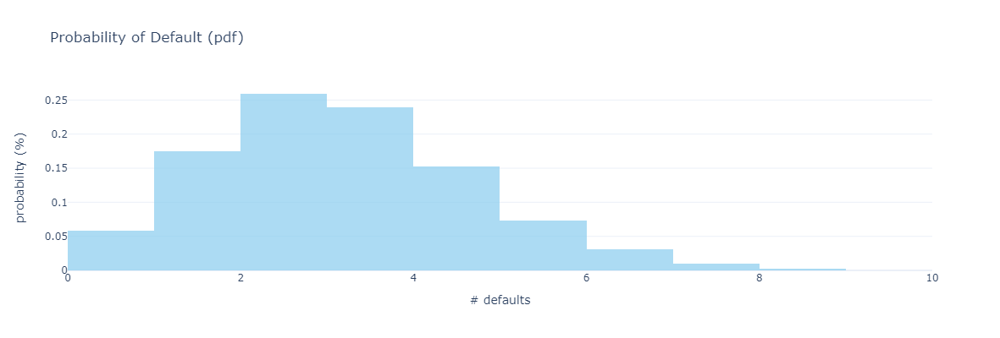

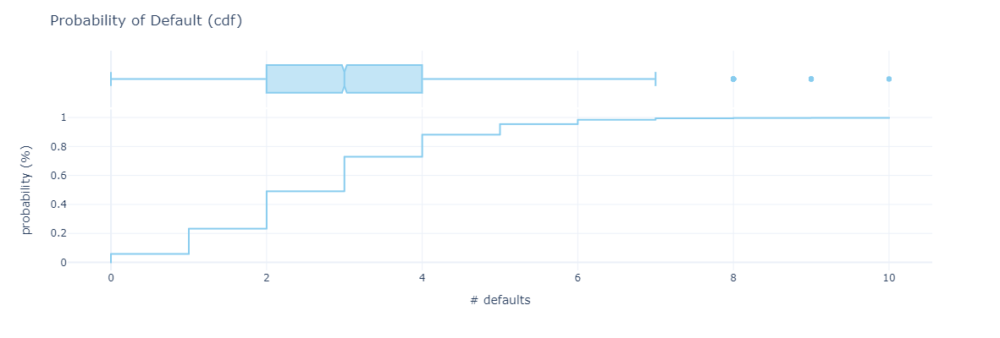

In [69]:
# numpy binomial distribution simulations to estimate probabilities
rng = np.random.default_rng()
n,p,sims = 25,0.107,10000  # 25 bonds, prob of default for each bond, # simulations
trials =rng.binomial(n=n, p=p, size=sims) # returns an array with the number of successes in each trial
df = pd.DataFrame(trials, columns=["num-defaults"])  # convert to df

# count the number of observations to determine probabilities
calc_probability(trials,"Probability of all bonds defaulting",sims, "=",25)
calc_probability(trials,"Probability of no bonds defaulting",sims, "=",0)
calc_probability(trials,"Probability of 5 or more bonds defaulting",sims, ">=",5)

# plot probability-density-function, and cumulative-probability-function
plot_pdf(df,'Probability of Default (pdf)', show_hist=True, show_curve=False, show_rug=False, xtitle='# defaults') 
plot_cdf(df, 'Probability of Default (cdf)',marginal='box',xtitle='# defaults')

## Normal Distribution
+ often used to model an assets returns (but not an assets price=> see lognormal distrtibution)
+ central limit theorm: the mean of a large number of independent random variables is approximately normally distributed
+ symmetrical and bell shaped
+ require two parameters: mu (mean), and sigma (standard deviation)
+ skewness=0 (symmetric)
+ kurtosis=3
+ mean==median=mode
+ standard normal (unit) distribution
    + mu = 0
    + sigma = 1
    + 68% of all observations fall within mu +/- sigma
    + 95% of all observations fall within mu +/- 2sigma
    + 99% of all observations fall within mu +/- 3sigma

### Univariate Distribution
+ model portfolio assets individually as a single random variable
+ nearly all the probablity of an assets returns are contained within 2 standard deviations of the mean
+ to model independent securities requires the following:
    + mean return of the security returns
    + standard deviation of the security returns

### Multivariate Distribution
+ model portfolio assets as a group of related random variables
+ to model a portfolio of non-independent securities requires the following
    + mean returns of the individual securities
    + standard deviation of individual security returns
    + pairwise correlations between individual security returns
    + For a full example of a multivariate distribution using a monte carlo simultion have a look at the [monte-carlo-for-investment](https://github.com/kconstable/monte-carlo-for-investments) github project



Probability lower than -1 sigma?
Prob that a1 <= 1 sigma below mu = 15.45%

Probability between -1 and +1 sigma?
Prob that a1 <= 1 sigma below mu = 84.09%
-1 to +1 sigma = 68.26%

Probability lower than 2 standard deviations?
Prob that a1 <= 1 sigma below mu = 2.03%
Prob that a2 <= 1 sigma below mu = 15.12%


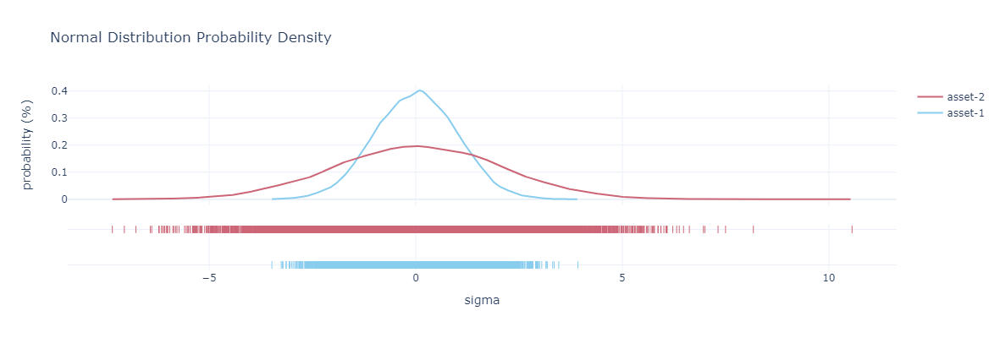

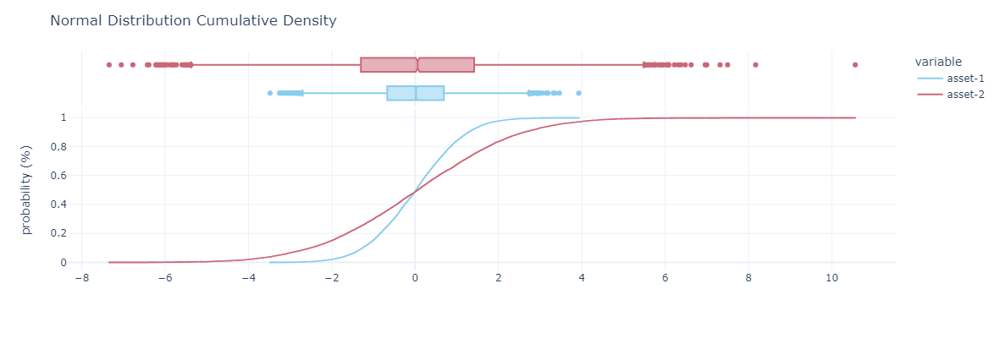

In [70]:
sims = 10000
a1=np.random.default_rng().normal(0, 1, sims)
a2=np.random.default_rng().normal(0, 2, sims)
df_a1=pd.DataFrame(a1,columns=["asset-1"])
df_a2=pd.DataFrame(a2,columns=['asset-2'])
df = df_a1.join(df_a2)

# calc probabiliites
print("\nProbability lower than -1 sigma?")
print("="*75)
calc_probability(a1,"Prob that a1 <= 1 sigma below mu",sims, "<=",-1)

print("\nProbability between -1 and +1 sigma?")
print("="*75)
calc_probability(a1,"Prob that a1 <= 1 sigma below mu",sims, "<=",1)
print(f"-1 to +1 sigma = {(84.2-15.94):,.2f}%")  # less than +1 minus lower than -1

print("\nProbability lower than 2 standard deviations?")
print("="*75)
calc_probability(a1,"Prob that a1 <= 1 sigma below mu",sims, "<=",-2)
calc_probability(a2,"Prob that a2 <= 1 sigma below mu",sims, "<=",-2)


plot_pdf(df, title='Normal Distribution Probability Density',xtitle='sigma',show_hist=False)
plot_cdf(df, title='Normal Distribution Cumulative Density',xtitle='')



Probability the asset will return greater than 20%?
Probability of a return greater than 20%  = 36.23%

Probability the asset will return between 12-20%?
Probability of a return less than 8%  = 63.77%
Probability of a return less than 8%  = 49.49%
=> ~64% - 49% = 15.00%

Probability the asset will have a higher return than a t-bill (5.5%)?
Probability of a return less than 5.5%  = 38.03%


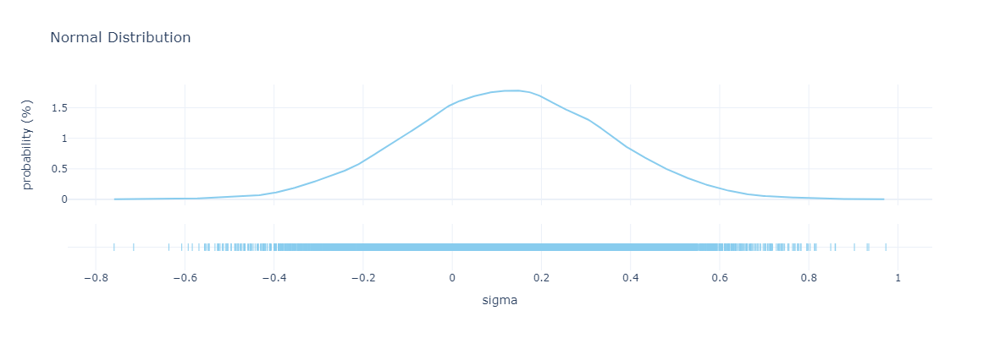

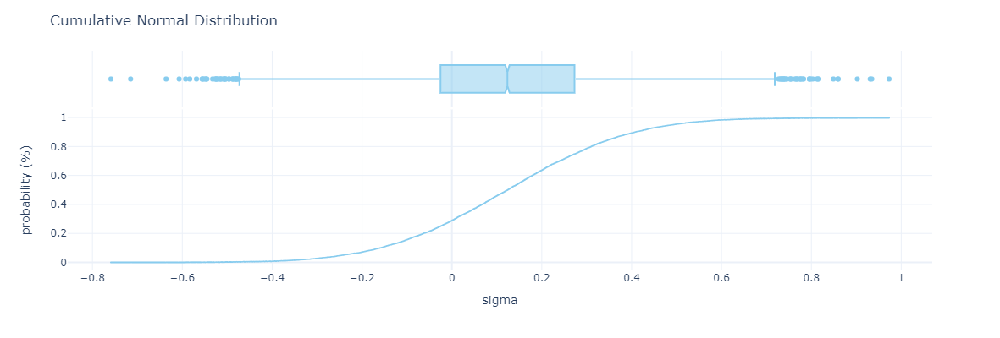

In [71]:
# use numpy to simulate univariate asset returns using the mean and standard deviation
mu    = 0.12    # mean average return
sigma = 0.22    # annual standard deviation of returns
n     = 10000   # simulations of annual returns
returns = np.random.default_rng().normal(mu, sigma, n)
df = pd.DataFrame(returns, columns=['returns'])

# calculate return probabilities
print("\nProbability the asset will return greater than 20%?")
print("="*75)
calc_probability(returns,"Probability of a return greater than 20% ",n, ">",0.20)

print("\nProbability the asset will return between 12-20%?")
print("="*75)
calc_probability(returns,"Probability of a return less than 8% ",n, "<=",0.20)
calc_probability(returns,"Probability of a return less than 8% ",n, "<",0.12)
print(f"=> ~64% - 49% = {(64-49):,.2f}%")  # less than +1 minus lower than -1


print("\nProbability the asset will have a higher return than a t-bill (5.5%)?")
calc_probability(returns,"Probability of a return less than 5.5% ",n, "<",0.055)
print("="*75)


plot_pdf(df, title='Normal Distribution',xtitle='sigma',show_hist=False)
plot_cdf(df,title="Cumulative Normal Distribution", xtitle="sigma")


#### Short-fall Risk: Optimization
Portfolio value is 800,000, we want to ensure we can withdrawl $30,000 without invading the initial capital of the portfolio.
Given three different portfolio allocations
+ What is the return shortfall level?
+ which allocation is the best to preserve the captial above the shortfall level?
+ what is the probability the the optimal safety-first portfolio will be less than the shortfall level?


| Allocation         | A  | B  | C  |
|--------------------|----|----|----|
| Expected Return    | 25 | 11 | 14 |
| Standard Deviation | 27 | 8  | 20 |

Shortfall Level:3.75%
SFRatio (P1):0.79
SFRatio (P2):0.91<= optimal portfolio
SFRatio (P3):0.51


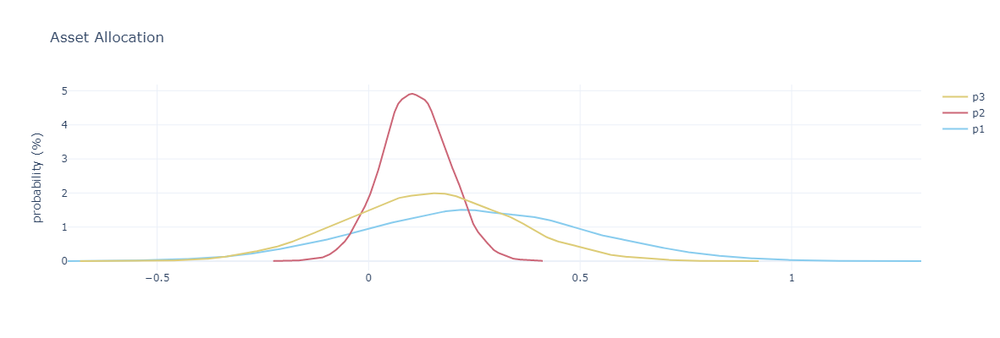

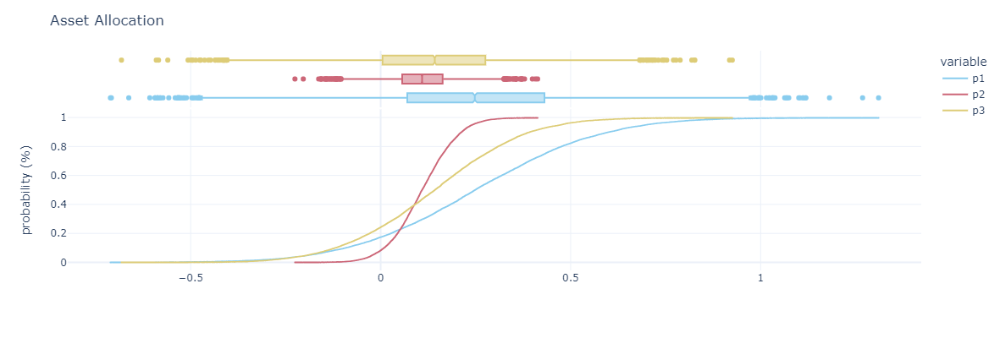

Probability p1 will return less than 3.75%  = 21.32%
Probability p2 will return less than 3.75%  = 17.50%
Probability p3 will return less than 3.75%  = 30.20%


0.302

In [72]:
print(f"Shortfall Level:{30000/800000*100:,.2f}%")
print(f"SFRatio (P1):{(25-3.75)/27:,.2f}")
print(f"SFRatio (P2):{(11-3.75)/8:,.2f}<= optimal portfolio")
print(f"SFRatio (P3):{(14-3.75)/20:,.2f}")


# use numpy to simulate univariate asset returns using the mean and standard deviation

# portfolio 1
p1 = np.random.default_rng().normal(0.25, 0.27, 10000)
df1 = pd.DataFrame(p1, columns=['p1'])

# portfolio 2
p2 = np.random.default_rng().normal(0.11, 0.08, 10000)
df2 = pd.DataFrame(p2, columns=['p2'])

# portfolio 3
p3 = np.random.default_rng().normal(0.14, 0.20, 10000)
df3 = pd.DataFrame(p3, columns=['p3'])

# combine into a df
df = df1.join(df2).join(df3)

# probability density plots
plot_pdf(df,title='Asset Allocation',xtitle='',show_hist=False, show_rug=False)
plot_cdf(df,title='Asset Allocation', xtitle='')

# prob that the portfolio will fall below 3.75%
calc_probability(p1,"Probability p1 will return less than 3.75% ",10000, "<",0.0375)
calc_probability(p2,"Probability p2 will return less than 3.75% ",10000, "<",0.0375)
calc_probability(p3,"Probability p3 will return less than 3.75% ",10000, "<",0.0375)

## Lognormal Distribution
+ Y follows a lognormal distribution if its natural logarithm ln(Y) is normally distributed
+ often used to model asset prices which have a minimum value (zero) but no maximum value
+ lognormal distribution is bounded by zero, and skews to the right
+ you can model asset **returns** with a normal distribution
+ params
    + mean of its normal distribution ln(y)
    + standard deviation of its normal distribution ln(y)

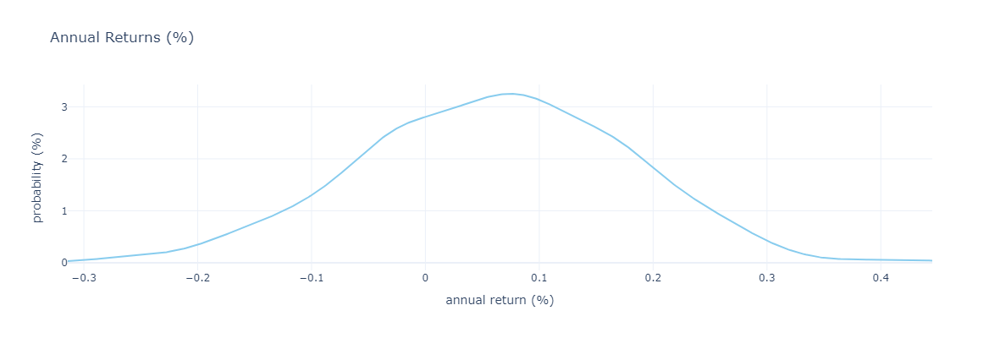

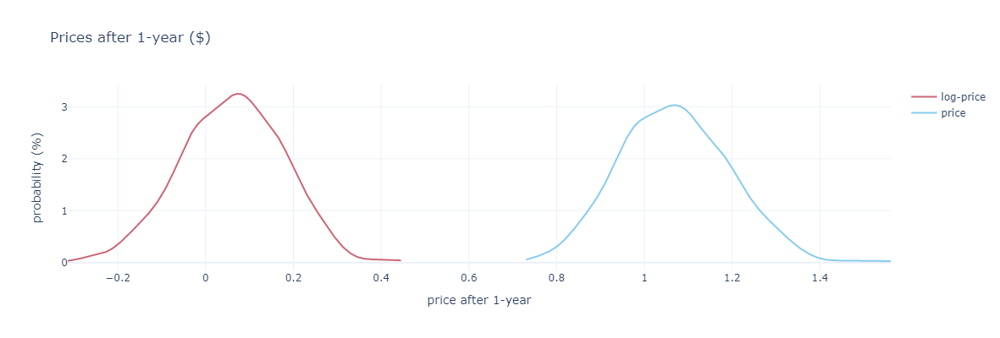

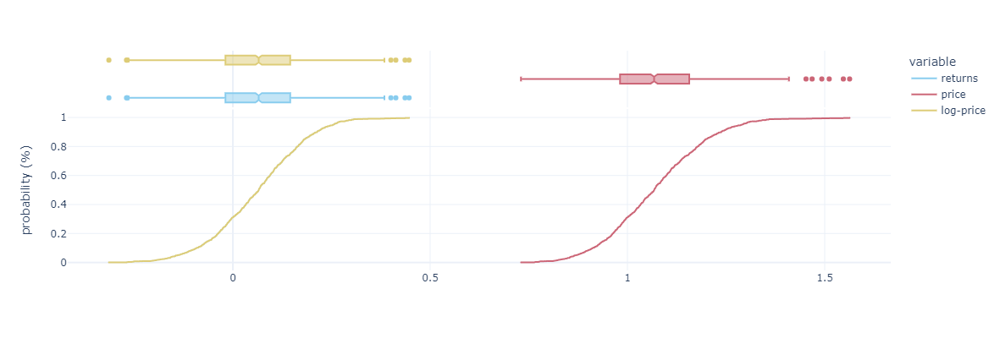

In [73]:
mu    = 0.07    # mean average return
sigma = 0.12    # annual standard deviation of returns
n     = 1000   # simulations of annual returns
returns = np.random.default_rng().normal(mu, sigma, n)
prices = 1*(np.exp(returns))
log_prices = np.log(prices)
df = pd.DataFrame(list(zip(returns, prices, log_prices)), columns=['returns','price','log-price'])


plot_pdf(df['returns'],title='Annual Returns (%)',xtitle='annual return (%)',show_hist=False, show_rug=False)
plot_pdf(df[['price','log-price']],title='Prices after 1-year ($)',xtitle='price after 1-year',show_hist=False, show_rug=False)
plot_cdf(df,title='',xtitle='', marginal='box')



## Students T Distribution
+ family of symmetrical distributions with fatter tails than normal distribution, similar to asset returns
+ defined by a single parameter=degrees of freedom (df) (sample-size)
+ the higher the df, the closer the t-distribution is to the normal distribution (the tails getter thinner with increasing sample size)

**Applications in Investments**
+ often used to model asset returns as it can provide a better estimate of downside risk estimates
+ t-statistic
    + test of a single population mean
    + test of differences between two population means
    + mean difference of paired (dependent) populations
    + test of correlation coefficients

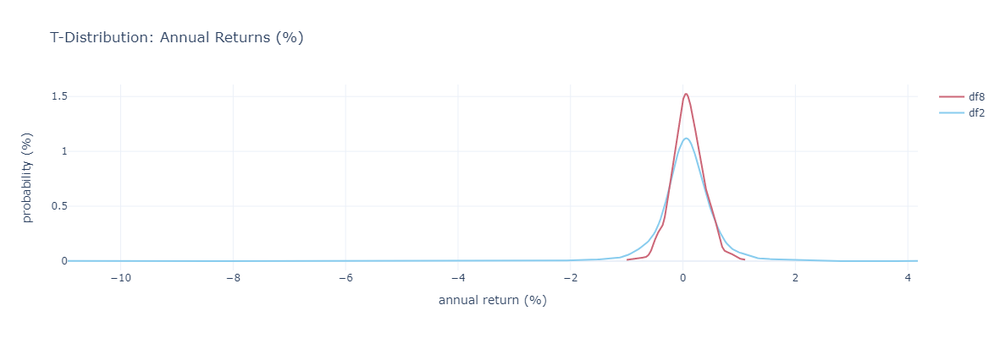

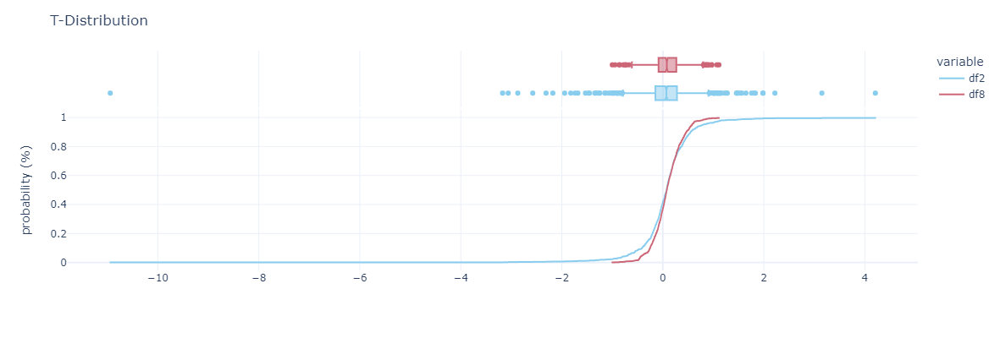

In [55]:
mu = 0.08
sigma = 0.25
size = 1000

# use scipy to generate random returns with mean=mu, sigma=sigma from the students t-distribution
# the higher the degrees of freedom, the closer it will resemble the normal distribution
t2=t(df=2,loc=mu,scale=sigma).rvs(size=size)
t8=t(df=8,loc=mu,scale=sigma).rvs(size=size)
df = pd.DataFrame(list(zip(t2,t8)),columns = ['df2','df8'])

plot_pdf(df,title='T-Distribution: Annual Returns (%)',xtitle='annual return (%)',show_hist=False, show_rug=False)
plot_cdf(df,title='T-Distribution',xtitle='',marginal='box')


## Chi-Square Distribution
+ asymmetrical family of distributions
+ sum of the squares of k independent standard random variables (will only have positive values)
+ the distribution varies with df

**Applications in Investments**
+ chi-square statistic
    + test of variance of a normally distributed population

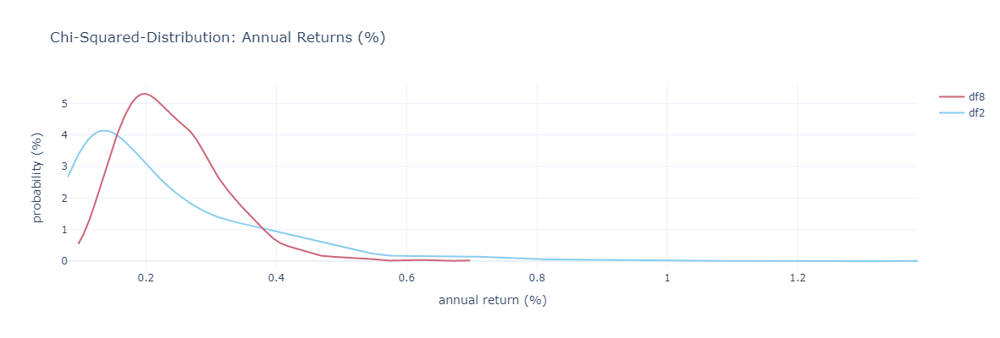

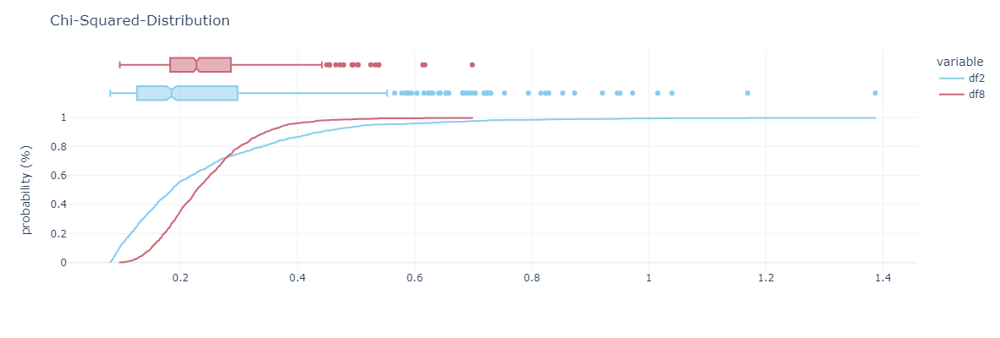

In [59]:
mu = 0.08
size = 1000

# use scipy to generate random returns with mean=mu, scale = 2* mu/degrees freedom from the chi-squared distribution
# the higher the degrees of freedom, the closer it will resemble the normal distribution
c2=chi2(df=2,loc=mu,scale=2*mu/2).rvs(size=size)
c8=chi2(df=8,loc=mu,scale=2*mu/8).rvs(size=size)
df = pd.DataFrame(list(zip(c2,c8)),columns = ['df2','df8'])

plot_pdf(df,title='Chi-Squared-Distribution: Annual Returns (%)',xtitle='annual return (%)',show_hist=False, show_rug=False)
plot_cdf(df,title='Chi-Squared-Distribution',xtitle='',marginal='box')

## F-Distribution
+ asymmetrical family of distributions
+ ratio of chi-squared distributions df(numerator)/df(denominator)
+ only positive values
+ as df increase, the f-distribution approaches the normal distribution

**Applications in Investments**
+ F- statistic
    + test of equality of variences of two normally distributed populations

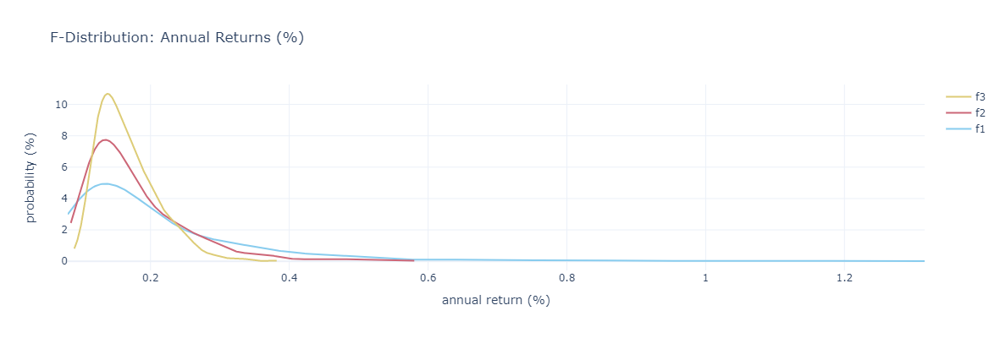

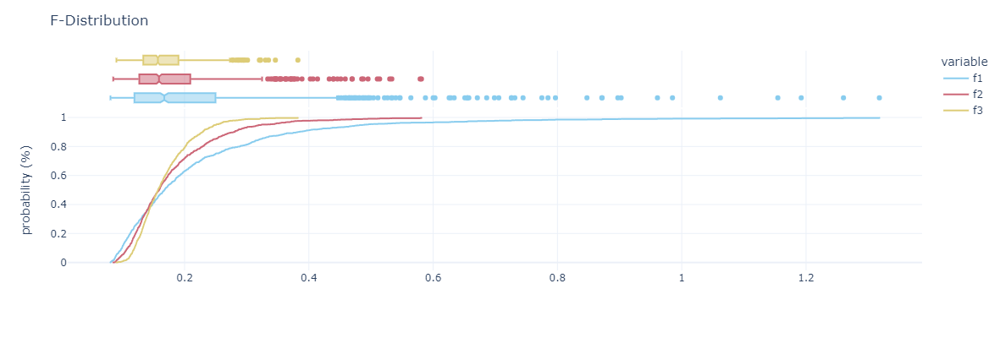

In [64]:
mu = 0.08
size = 1000
dfn = 10
dfd = 20

scale = mu * (dfd/(dfd-2))

# use scipy to generate random returns with mean=mu, scale = 2* mu/degrees freedom from the chi-squared distribution
# the higher the degrees of freedom, the closer it will resemble the normal distribution
dfn = 3
dfd = 10
scale = mu * (dfd/(dfd-2))
f1=f(dfn,dfd,loc=mu,scale=scale).rvs(size=size)

dfn = 5
dfd = 20
scale = mu * (dfd/(dfd-2))
f2=f(dfn,dfd,loc=mu,scale=scale).rvs(size=size)

dfn = 10
dfd = 50
scale = mu * (dfd/(dfd-2))
f3=f(dfn,dfd,loc=mu,scale=scale).rvs(size=size)

df = pd.DataFrame(list(zip(f1,f2,f3)),columns = ['f1','f2','f3'])

plot_pdf(df,title='F-Distribution: Annual Returns (%)',xtitle='annual return (%)',show_hist=False, show_rug=False)
plot_cdf(df,title='F-Distribution',xtitle='',marginal='box')